In [0]:
# installing necessaries packeges and modules
%pip install googletrans==4.0.0-rc1

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
pip install spacy

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
!python -m spacy download en_core_web_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 74.8 MB/s eta 0:00:00

[notice] A new release of pip is available: 25.0.1 -> 25.3
[notice] To update, run: pip install --upgrade pip
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [0]:
pip install nltk

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
pip install langdetect

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
pip install textblob

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


In [0]:
# restarting server
dbutils.library.restartPython()

In [0]:
# loading dataset
tweets = spark.table('bitcoin_tweets')
display(tweets)

id,user,fullname,url,timestamp,replies,likes,retweets,text
1.1329770553003008E18,KamdemAbdiel,Abdiel kamdem,null,2019-05-27T11:49:14.000Z,0.0,0.0,0.0,È appena uscito un nuovo video! LES CRYPTOMONNAIES QUI PULVÉRISENT BITCOIN EN 2019 https://t.co/yCsQMvRnyS
1.13297707340273664E18,bitcointe,Bitcointe,null,2019-05-27T11:49:18.000Z,0.0,0.0,0.0,Cardano: Digitize Currencies; EOS https://t.co/1kTKqKEBlS 6500% ROI; AT&T Bitcoin Bill Pay https://t.co/eQCwOXKHK0 | Cardano (ADA) 🌏📢😎🤑💵 | #FolloForFolloBack #follo4folloback #followforfollow #bitcointe #cryptocurrency
1.13297702389313958E18,3eyedbran,Bran - 3 Eyed Raven,null,2019-05-27T11:49:06.000Z,0.0,2.0,1.0,Another Test tweet that wasn't caught in the stream ! bitcoin
1.13297708908955635E18,DetroitCrypto,J. Scardina,null,2019-05-27T11:49:22.000Z,0.0,0.0,0.0,Current Crypto Prices!
null,null,null,null,null,null,null,null,null
null,null,null,null,null,null,null,null,null
null,null,null,null,null,null,null,null,null
null,null,null,null,null,null,null,null,null
null,null,null,null,null,null,null,null,null
null,null,null,null,null,null,null,null,null


In [0]:
from pyspark.sql.functions import col

# clenaing some features
tweets = tweets.drop('url', 'user', 'fullname')
tweets = tweets.dropna()
# casting timestamp col to timestamp type
tweets_clean = tweets.withColumn('timestamp', col('timestamp').cast('timestamp'))
display(tweets)

id,timestamp,replies,likes,retweets,text
1.1329770553003008E18,2019-05-27T11:49:14.000Z,0.0,0.0,0.0,È appena uscito un nuovo video! LES CRYPTOMONNAIES QUI PULVÉRISENT BITCOIN EN 2019 https://t.co/yCsQMvRnyS
1.13297707340273664E18,2019-05-27T11:49:18.000Z,0.0,0.0,0.0,Cardano: Digitize Currencies; EOS https://t.co/1kTKqKEBlS 6500% ROI; AT&T Bitcoin Bill Pay https://t.co/eQCwOXKHK0 | Cardano (ADA) 🌏📢😎🤑💵 | #FolloForFolloBack #follo4folloback #followforfollow #bitcointe #cryptocurrency
1.13297702389313958E18,2019-05-27T11:49:06.000Z,0.0,2.0,1.0,Another Test tweet that wasn't caught in the stream ! bitcoin
1.13297708908955635E18,2019-05-27T11:49:22.000Z,0.0,0.0,0.0,Current Crypto Prices!
1.13297709234019123E18,2019-05-27T11:49:23.000Z,0.0,0.0,0.0,Spiv (Nosar Baz): BITCOIN Is An Asset & NOT A Currency.
1.13297710030931955E18,2019-05-27T11:49:25.000Z,0.0,0.0,0.0,"#btc inceldiği yerden kopsun bakalım 17:00 ye kadar bir hareket bekliyorum, yukarı yönlü olur umarın sanırım inşallah yani 😁 https://t.co/pIMyKfNtc8"
1.13297710163889766E18,2019-05-27T11:49:25.000Z,0.0,0.0,0.0,@nwoodfine We have been building on the real #bitcoin SV.
1.1329771088363232E18,2019-05-27T11:49:27.000Z,0.0,0.0,0.0,"@pedronauck como investidor, vc é um ótimo dev. Sorte q eu comprei os BTC, subiu a poha toda :o"
1.13297713185035059E18,2019-05-27T11:49:32.000Z,0.0,0.0,0.0,ブラジルはまぁ置いといてもドイツは存在感出してくるのかな。ロシアもマイニングなどで元気になるかと思ったらそこまででしたね。
1.13297713271456154E18,2019-05-27T11:49:32.000Z,0.0,0.0,0.0,"CHANGE IS COMING...GET READY!!! Boom, Another [CB] Jab, Nothing Can Stop This! Globalism at its end stage, [CB] push to make a one world govt. coming to an end."


In [0]:
# converting to pandas
pd_tweets = tweets.toPandas()
pd_tweets = pd_tweets[pd_tweets['text'].str.len() > 5]
pd_tweets

,id,timestamp,replies,likes,retweets,text
0,1.132977e+18,2019-05-27 11:49:14,0.0,0.0,0.0,È appena uscito un nuovo video! LES CRYPTOMONN...
1,1.132977e+18,2019-05-27 11:49:18,0.0,0.0,0.0,Cardano: Digitize Currencies; EOS https://t.co...
2,1.132977e+18,2019-05-27 11:49:06,0.0,2.0,1.0,Another Test tweet that wasn't caught in the s...
3,1.132977e+18,2019-05-27 11:49:22,0.0,0.0,0.0,Current Crypto Prices! \n
4,1.132977e+18,2019-05-27 11:49:23,0.0,0.0,0.0,Spiv (Nosar Baz): BITCOIN Is An Asset &amp; NO...
...,...,...,...,...,...,...
99996,1.127210e+18,2019-05-11 11:52:58,0.0,0.0,1.0,😂😂😂 facts #bitcoin https://t.co/mmI634HtKc
99997,1.127210e+18,2019-05-11 11:53:37,0.0,0.0,0.0,"BitcoinLend Airdropping 1,000,000 BLEND ($1,00..."
99998,1.127210e+18,2019-05-11 11:53:58,0.0,0.0,0.0,#inzura #tokensale\n
99999,1.127210e+18,2019-05-11 11:54:15,0.0,0.0,0.0,"XRP, Bitcoin and other coins to be made availa..."


In [0]:
# importing libraries needed for data cleaning
import langdetect
import string
import spacy
import nltk
from nltk.corpus import stopwords
import re


nltk.download('stopwords')
nlp = spacy.load("en_core_web_sm")
stopwords = stopwords.words('english')
punctuation = set(string.punctuation)

# defining data cleaner function
def data_cleaner(sentence):

  sentence = sentence.lower()
  for c in string.punctuation:
      sentence = sentence.replace(c, " ")
  document = nlp(sentence)
  sentence = ' '.join(token.lemma_ for token in document)
  sentence = ' '.join(word for word in sentence.split() if word not in stopwords)
  sentence = re.sub(r'\d', '', sentence)
  sentence = re.sub(r"http\S+", "", sentence)
  sentence = re.sub(r"@\w+", "", sentence)

  return sentence.split()

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/spark-0bbcd455-312c-4c4b-8b64-2f/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [0]:
 # I tried with translator from googletranslate, but it does not work with free edition. So I went with langdectect

# defining def to prepare texts for langdetect
def detect_lang(text):
    if not text or not text.strip():
        return 'unknown'
    try:
        return langdetect.detect(text)
    except Exception:
        return 'unknown'

# applying language detect def to df
pd_tweets['traslated_text'] = pd_tweets['text'].apply(detect_lang)

In [0]:
# filtering only english tweets
pd_tweets = pd_tweets[pd_tweets['traslated_text'] == 'en']
pd_tweets

,id,timestamp,replies,likes,retweets,text,traslated_text
1,1.132977e+18,2019-05-27 11:49:18,0.0,0.0,0.0,Cardano: Digitize Currencies; EOS https://t.co...,en
2,1.132977e+18,2019-05-27 11:49:06,0.0,2.0,1.0,Another Test tweet that wasn't caught in the s...,en
3,1.132977e+18,2019-05-27 11:49:22,0.0,0.0,0.0,Current Crypto Prices! \n,en
4,1.132977e+18,2019-05-27 11:49:23,0.0,0.0,0.0,Spiv (Nosar Baz): BITCOIN Is An Asset &amp; NO...,en
6,1.132977e+18,2019-05-27 11:49:25,0.0,0.0,0.0,@nwoodfine We have been building on the real #...,en
...,...,...,...,...,...,...,...
99995,1.127210e+18,2019-05-11 11:52:40,0.0,0.0,0.0,"Never, ever touch bitcoin investments,bound to...",en
99996,1.127210e+18,2019-05-11 11:52:58,0.0,0.0,1.0,😂😂😂 facts #bitcoin https://t.co/mmI634HtKc,en
99997,1.127210e+18,2019-05-11 11:53:37,0.0,0.0,0.0,"BitcoinLend Airdropping 1,000,000 BLEND ($1,00...",en
99999,1.127210e+18,2019-05-11 11:54:15,0.0,0.0,0.0,"XRP, Bitcoin and other coins to be made availa...",en


In [0]:
# applying data cleaner function to english text in order to get tokens
pd_tweets['text_tokens'] = pd_tweets['text'].apply(data_cleaner)
pd_tweets

/home/spark-0bbcd455-312c-4c4b-8b64-2f/.ipykernel/19893/command-6261273473503464-3712146521:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_tweets['text_tokens'] = pd_tweets['text'].apply(data_cleaner)


,id,timestamp,replies,likes,retweets,text,traslated_text,text_tokens
1,1.132977e+18,2019-05-27 11:49:18,0.0,0.0,0.0,Cardano: Digitize Currencies; EOS https://t.co...,en,"[cardano, digitize, currency, eos, co, ktkqkeb..."
2,1.132977e+18,2019-05-27 11:49:06,0.0,2.0,1.0,Another Test tweet that wasn't caught in the s...,en,"[another, test, tweet, catch, stream, bitcoin]"
3,1.132977e+18,2019-05-27 11:49:22,0.0,0.0,0.0,Current Crypto Prices! \n,en,"[current, crypto, price]"
4,1.132977e+18,2019-05-27 11:49:23,0.0,0.0,0.0,Spiv (Nosar Baz): BITCOIN Is An Asset &amp; NO...,en,"[spiv, nosar, baz, bitcoin, asset, amp, currency]"
6,1.132977e+18,2019-05-27 11:49:25,0.0,0.0,0.0,@nwoodfine We have been building on the real #...,en,"[nwoodfine, build, real, bitcoin, sv]"
...,...,...,...,...,...,...,...,...
99995,1.127210e+18,2019-05-11 11:52:40,0.0,0.0,0.0,"Never, ever touch bitcoin investments,bound to...",en,"[never, ever, touch, bitcoin, investment, bind..."
99996,1.127210e+18,2019-05-11 11:52:58,0.0,0.0,1.0,😂😂😂 facts #bitcoin https://t.co/mmI634HtKc,en,"[😂, 😂, 😂, fact, bitcoin, co, mmihtkc]"
99997,1.127210e+18,2019-05-11 11:53:37,0.0,0.0,0.0,"BitcoinLend Airdropping 1,000,000 BLEND ($1,00...",en,"[bitcoinlend, airdrop, blend, also, earn, blen..."
99999,1.127210e+18,2019-05-11 11:54:15,0.0,0.0,0.0,"XRP, Bitcoin and other coins to be made availa...",en,"[xrp, bitcoin, coin, make, available, purchase..."


In [0]:
# importing textblob librery to get sentiment analysis
from textblob import TextBlob

# defining function to get sentiment polarity
def get_textblob_sentiment(text):
    try:
        blob = TextBlob(str(text))
        
        return blob.sentiment.polarity
    except:
        return 0.0

# applying function to get sentiment polarity
pd_tweets['sentiment_textblob'] = pd_tweets['text_tokens'].apply(get_textblob_sentiment)

# defining labels
pd_tweets['label_textblob'] = pd_tweets['sentiment_textblob']\
    .apply(lambda x: 'positive' if x > 0.3 else ('negative' if x < -0.3 else 'neutral'))
display(pd_tweets)

/home/spark-0bbcd455-312c-4c4b-8b64-2f/.ipykernel/19893/command-6261273473503465-4160198263:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_tweets['sentiment_textblob'] = pd_tweets['text_tokens'].apply(get_textblob_sentiment)
/home/spark-0bbcd455-312c-4c4b-8b64-2f/.ipykernel/19893/command-6261273473503465-4160198263:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_tweets['label_textblob'] = pd_tweets['sentiment_textblob']\


id,timestamp,replies,likes,retweets,text,traslated_text,text_tokens,sentiment_textblob,label_textblob
1.13297707340273664E18,2019-05-27T11:49:18.000Z,0.0,0.0,0.0,Cardano: Digitize Currencies; EOS https://t.co/1kTKqKEBlS 6500% ROI; AT&T Bitcoin Bill Pay https://t.co/eQCwOXKHK0 | Cardano (ADA) 🌏📢😎🤑💵 | #FolloForFolloBack #follo4folloback #followforfollow #bitcointe #cryptocurrency,en,"List(cardano, digitize, currency, eos, co, ktkqkebls, roi, amp, bitcoin, bill, pay, co, eqcwoxkhk, cardano, ada, 🌏, 📢, 😎, 🤑, 💵, folloforfolloback, follofolloback, followforfollow, bitcointe, cryptocurrency)",0.0,neutral
1.13297702389313958E18,2019-05-27T11:49:06.000Z,0.0,2.0,1.0,Another Test tweet that wasn't caught in the stream ! bitcoin,en,"List(another, test, tweet, catch, stream, bitcoin)",0.0,neutral
1.13297708908955635E18,2019-05-27T11:49:22.000Z,0.0,0.0,0.0,Current Crypto Prices!,en,"List(current, crypto, price)",0.0,neutral
1.13297709234019123E18,2019-05-27T11:49:23.000Z,0.0,0.0,0.0,Spiv (Nosar Baz): BITCOIN Is An Asset & NOT A Currency.,en,"List(spiv, nosar, baz, bitcoin, asset, amp, currency)",0.0,neutral
1.13297710163889766E18,2019-05-27T11:49:25.000Z,0.0,0.0,0.0,@nwoodfine We have been building on the real #bitcoin SV.,en,"List(nwoodfine, build, real, bitcoin, sv)",0.2,neutral
1.13297713271456154E18,2019-05-27T11:49:32.000Z,0.0,0.0,0.0,"CHANGE IS COMING...GET READY!!! Boom, Another [CB] Jab, Nothing Can Stop This! Globalism at its end stage, [CB] push to make a one world govt. coming to an end.",en,"List(change, come, get, ready, boom, another, cb, jab, nothing, stop, globalism, end, stage, cb, push, make, one, world, govt, come, end)",0.2,neutral
1.13297707692193382E18,2019-05-27T11:49:19.000Z,0.0,14.0,2.0,"One of the useful articles of Stefan; here is the guide, you can run a @LTOnetwork node on Alibaba Cloud.",en,"List(one, useful, article, stefan, guide, run, ltonetwork, node, alibaba, cloud)",0.3,neutral
1.13120866242335539E18,2019-05-22T12:42:16.000Z,3.0,2.0,7.0,BestMixer has been seized by the Dutch Police / Luxembourg Police and French Police w/ association from Europol. BestMixer was a Bitcoin Mixer/Tumbler. #Cryptocurrency #Bitcoin #BestMixer https://t.co/dXrEY9yAtt,en,"List(bestmixer, seize, dutch, police, luxembourg, police, french, police, w, association, europol, bestmixer, bitcoin, mixer, tumbler, cryptocurrency, bitcoin, bestmixer, co, dxreyyatt)",0.0,neutral
1.13297712210298061E18,2019-05-27T11:49:30.000Z,1.0,1.0,1.0,Invested my Life Savings into Bitcoin and Ethereum | Vlog #09 https://t.co/CEL0BXw3fs https://t.co/AET16t8a56,en,"List(invest, life, saving, bitcoin, ethereum, vlog, co, celbxwfs, co, aetta)",0.0,neutral
1.13292266311302362E18,2019-05-27T08:13:06.000Z,5.0,167.0,68.0,"Bitcoin Price Hits $8,939 in New 2019 High: What’s Driving the Hypnotic Rally? https://t.co/BADC8cBQdd",en,"List(bitcoin, price, hit, new, high, ’s, drive, hypnotic, rally, co, badccbqdd)",0.1481818181818182,neutral


In [0]:
# importing pandas to use pandas method
import pandas as pd

# extraction period from timestamp
pd_tweets['date'] = pd_tweets['timestamp'].dt.date
pd_tweets['period'] = pd_tweets['timestamp'].dt.to_period('M').dt.to_timestamp()

# having just year and month
pd_tweets['period'] = pd_tweets['period'].dt.strftime('%Y-%m')

# grouping by period and labels, with labels in columns
period_sentiment = pd_tweets.groupby(['period','label_textblob']).size().unstack(fill_value=0)

# having date as index
period_sentiment = period_sentiment.reset_index()
display(period_sentiment)

/home/spark-0bbcd455-312c-4c4b-8b64-2f/.ipykernel/19893/command-8323854963636976-796695366:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_tweets['date'] = pd_tweets['timestamp'].dt.date
/home/spark-0bbcd455-312c-4c4b-8b64-2f/.ipykernel/19893/command-8323854963636976-796695366:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pd_tweets['period'] = pd_tweets['timestamp'].dt.to_period('M').dt.to_timestamp()
/home/spark-0bbcd455-312c-4c4b-8b64-2f/.ipykernel/19893/command-8323854963636976-796695366:9: Settin

period,negative,neutral,positive
2009-01,0,1,0
2012-08,0,1,0
2013-08,0,1,0
2013-12,0,3,0
2014-02,0,1,0
2014-07,0,1,0
2014-12,0,1,0
2015-02,0,1,0
2015-09,0,0,1
2015-11,0,1,0


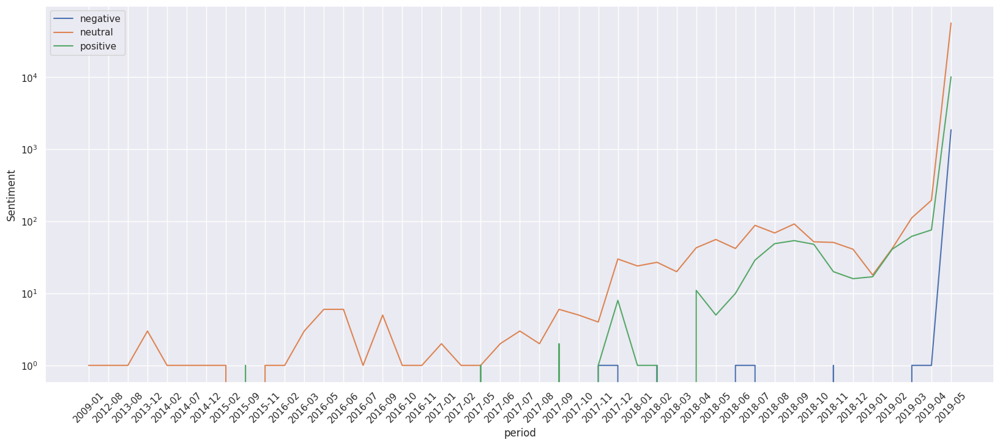

In [0]:
# importing libreries to visualize data
import matplotlib.pyplot as plt
import seaborn as sns

# defining function to plot daily sentiment dfs
def plot_sentiment(period, date: str):

    # setting seaborn theme
    sns.set_theme()

    # visualizing sentiment
    plt.rcParams['figure.figsize'] = [20, 8]
    sns.lineplot(x=date, y='negative', data=period, label='negative')
    sns.lineplot(x=date, y='neutral', data=period, label='neutral')
    sns.lineplot(x=date, y='positive', data=period, label='positive')
    plt.ylabel('Sentiment')
    plt.yscale('log') # -> log scale tweets to minimize datas distribution
    plt.xticks(rotation=45)
    plt.legend()
    plt.show()  


plot_s = plot_sentiment(period_sentiment, 'period')
plot_s

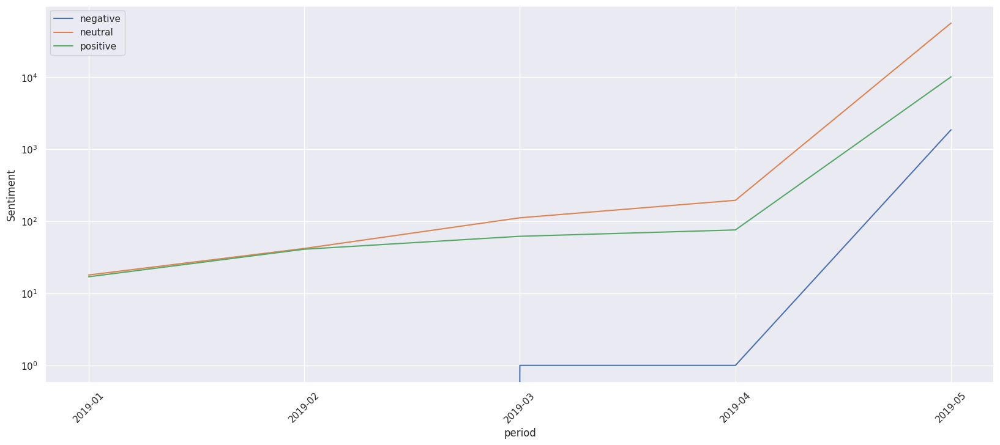

In [0]:
# preparing data to visualize 2019-tweet's sentiment
pd_tweets_c = pd_tweets.copy()
pd_tweets_c = pd_tweets_c[pd_tweets_c['period'].str.startswith('2019')]
sentiment_2019 = pd_tweets_c.groupby(['period','label_textblob']).size().unstack(fill_value=0)

plot_2019 = plot_sentiment(sentiment_2019, 'period')
plot_2019

In [0]:
# returning spark df
spark_tweets = spark.createDataFrame(pd_tweets)

# creating a temp view in order to use sql queries
spark_tweets.createOrReplaceTempView('bitcoin_sentiment')

In [0]:
# using sql to get the average of likes and replies for each sentiment
reactions =  spark.sql("""select label_textblob, round(avg(likes),2) as likes_mean, round(avg(replies),2) as _replies_mean  
                            from bitcoin_sentiment 
                            group by label_textblob""")
display(reactions)

label_textblob,likes_mean,_replies_mean
negative,7.83,0.88
neutral,8.51,0.93
positive,7.12,1.19


# OBSERVATION:
Positive sentiment has more engaggment in replies of negatives and neutrals ones

In [0]:
# loading btc_usd database
btc = spark.table('btc_usd')

# converting it to pandas
btc = btc.toPandas()

# converting date column to date type
btc['date'] = btc['Date'].dt.date

# merging tables
tweets_btc_usd = pd_tweets.merge(btc, on='date')

# dropping double date column
tweets_btc_usd = tweets_btc_usd.drop('date', axis=1)
display(tweets_btc_usd)

id,timestamp,replies,likes,retweets,text,traslated_text,text_tokens,sentiment_textblob,label_textblob,period,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
1.13297707340273664E18,2019-05-27T11:49:18.000Z,0.0,0.0,0.0,Cardano: Digitize Currencies; EOS https://t.co/1kTKqKEBlS 6500% ROI; AT&T Bitcoin Bill Pay https://t.co/eQCwOXKHK0 | Cardano (ADA) 🌏📢😎🤑💵 | #FolloForFolloBack #follo4folloback #followforfollow #bitcointe #cryptocurrency,en,"List(cardano, digitize, currency, eos, co, ktkqkebls, roi, amp, bitcoin, bill, pay, co, eqcwoxkhk, cardano, ada, 🌏, 📢, 😎, 🤑, 💵, folloforfolloback, follofolloback, followforfollow, bitcointe, cryptocurrency)",0.0,neutral,2019-05,2019-05-27T00:00:00.000Z,8674.072265625,8907.1748046875,8668.705078125,8805.7783203125,27949839564,0.0,0.0
1.13297702389313958E18,2019-05-27T11:49:06.000Z,0.0,2.0,1.0,Another Test tweet that wasn't caught in the stream ! bitcoin,en,"List(another, test, tweet, catch, stream, bitcoin)",0.0,neutral,2019-05,2019-05-27T00:00:00.000Z,8674.072265625,8907.1748046875,8668.705078125,8805.7783203125,27949839564,0.0,0.0
1.13297708908955635E18,2019-05-27T11:49:22.000Z,0.0,0.0,0.0,Current Crypto Prices!,en,"List(current, crypto, price)",0.0,neutral,2019-05,2019-05-27T00:00:00.000Z,8674.072265625,8907.1748046875,8668.705078125,8805.7783203125,27949839564,0.0,0.0
1.13297709234019123E18,2019-05-27T11:49:23.000Z,0.0,0.0,0.0,Spiv (Nosar Baz): BITCOIN Is An Asset & NOT A Currency.,en,"List(spiv, nosar, baz, bitcoin, asset, amp, currency)",0.0,neutral,2019-05,2019-05-27T00:00:00.000Z,8674.072265625,8907.1748046875,8668.705078125,8805.7783203125,27949839564,0.0,0.0
1.13297710163889766E18,2019-05-27T11:49:25.000Z,0.0,0.0,0.0,@nwoodfine We have been building on the real #bitcoin SV.,en,"List(nwoodfine, build, real, bitcoin, sv)",0.2,neutral,2019-05,2019-05-27T00:00:00.000Z,8674.072265625,8907.1748046875,8668.705078125,8805.7783203125,27949839564,0.0,0.0
1.13297713271456154E18,2019-05-27T11:49:32.000Z,0.0,0.0,0.0,"CHANGE IS COMING...GET READY!!! Boom, Another [CB] Jab, Nothing Can Stop This! Globalism at its end stage, [CB] push to make a one world govt. coming to an end.",en,"List(change, come, get, ready, boom, another, cb, jab, nothing, stop, globalism, end, stage, cb, push, make, one, world, govt, come, end)",0.2,neutral,2019-05,2019-05-27T00:00:00.000Z,8674.072265625,8907.1748046875,8668.705078125,8805.7783203125,27949839564,0.0,0.0
1.13297707692193382E18,2019-05-27T11:49:19.000Z,0.0,14.0,2.0,"One of the useful articles of Stefan; here is the guide, you can run a @LTOnetwork node on Alibaba Cloud.",en,"List(one, useful, article, stefan, guide, run, ltonetwork, node, alibaba, cloud)",0.3,neutral,2019-05,2019-05-27T00:00:00.000Z,8674.072265625,8907.1748046875,8668.705078125,8805.7783203125,27949839564,0.0,0.0
1.13120866242335539E18,2019-05-22T12:42:16.000Z,3.0,2.0,7.0,BestMixer has been seized by the Dutch Police / Luxembourg Police and French Police w/ association from Europol. BestMixer was a Bitcoin Mixer/Tumbler. #Cryptocurrency #Bitcoin #BestMixer https://t.co/dXrEY9yAtt,en,"List(bestmixer, seize, dutch, police, luxembourg, police, french, police, w, association, europol, bestmixer, bitcoin, mixer, tumbler, cryptocurrency, bitcoin, bestmixer, co, dxreyyatt)",0.0,neutral,2019-05,2019-05-22T00:00:00.000Z,7956.2919921875,7997.6123046875,7615.9873046875,7680.06640625,24719473175,0.0,0.0
1.13297712210298061E18,2019-05-27T11:49:30.000Z,1.0,1.0,1.0,Invested my Life Savings into Bitcoin and Ethereum | Vlog #09 https://t.co/CEL0BXw3fs https://t.co/AET16t8a56,en,"List(invest, life, saving, bitcoin, ethereum, vlog, co, celbxwfs, co, aetta)",0.0,neutral,2019-05,2019-05-27T00:00:00.000Z,8674.072265625,8907.1748046875,8668.705078125,8805.7783203125,27949839564,0.0,0.0
1.13292266311302362E18,2019-05-27T08:13:06.000Z,5.0,167.0,68.0,"Bitcoin Price Hits $8,939 in New 2019 High: What’s Driving the Hypnotic Rally? https://t.co/BADC8cBQdd",en,"List(bitcoin, price, hit, new, high, ’s, drive, hypnotic, r

In [0]:
# calculating price variation
tweets_btc_usd['price_pct_variation'] = round((tweets_btc_usd['Close'] - tweets_btc_usd['Open'])/tweets_btc_usd['Open'], 2)

# creating a column with total reactions
tweets_btc_usd['total_reactions'] = tweets_btc_usd['replies'] + tweets_btc_usd['likes'] + tweets_btc_usd['retweets']

# creating a group by object to get reactions' sum and price variation sorted by date
most_reactions = tweets_btc_usd.groupby(['Date'])[['total_reactions', 'price_pct_variation']].agg({'total_reactions': 'sum', 'price_pct_variation': 'first'}).sort_values(by='total_reactions', ascending=False)
most_reactions = most_reactions.reset_index()
display(most_reactions)

Date,total_reactions,price_pct_variation
2019-05-11T00:00:00.000Z,188847.0,0.13
2019-05-10T00:00:00.000Z,185979.0,0.03
2019-05-12T00:00:00.000Z,59010.0,-0.03
2019-05-09T00:00:00.000Z,39335.0,0.03
2019-05-08T00:00:00.000Z,27541.0,0.02
2019-05-27T00:00:00.000Z,25211.0,0.02
2019-05-13T00:00:00.000Z,20559.0,0.12
2018-10-08T00:00:00.000Z,15290.0,0.01
2019-05-25T00:00:00.000Z,14059.0,0.01
2019-05-26T00:00:00.000Z,13334.0,0.08


In [0]:
# creating a group by object to get direct correlation between reactions and price variation
sentiment_corr = round(most_reactions[['total_reactions', 'price_pct_variation']].corr(),4)
sentiment_corr = sentiment_corr.reset_index()
display(sentiment_corr)

index,total_reactions,price_pct_variation
total_reactions,1.0,0.13
price_pct_variation,0.13,1.0


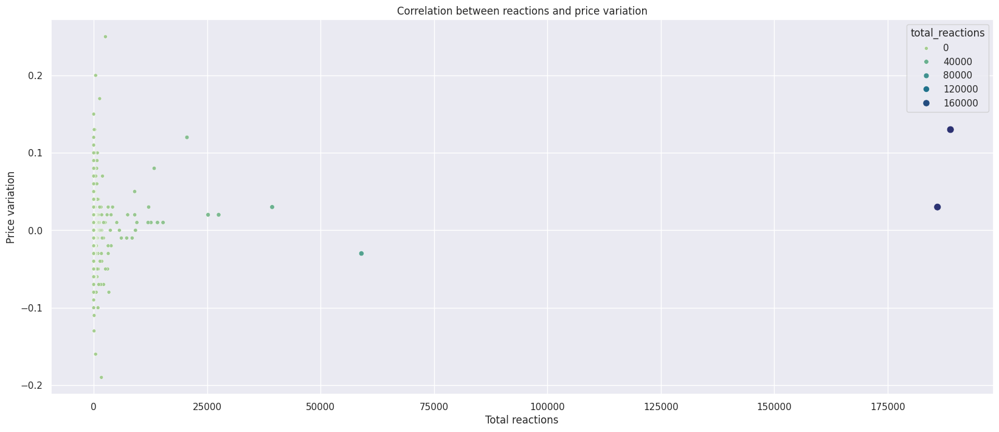

In [0]:
# plotting correlation
sns.scatterplot(x=most_reactions['total_reactions'], y=most_reactions['price_pct_variation'], hue=most_reactions['total_reactions'], palette='crest', size=most_reactions['total_reactions'])
plt.title('Correlation between reactions and price variation')
plt.xlabel('Total reactions')
plt.ylabel('Price variation')
plt.show()

# FINAL OBSERVATION:
For this project on 'Bitcoin Consensus' I executed the following steps: <br>
• installed necessaries packages and libreries; <br>
• load Tweets database with spark; <br>
• cleaned some fetures; <br>
• loaded spark table in pandas and filtered text feature by 5 longer chars tweets; <br>
• imported  NLP necesssaries libraries and defined a function to preprocessing datas;<br>
• used langdetect library to individuate english tweet, in order to define the sentiment with TextBlob library; <br>
• grouped by period (Year-month) and sentiment before, than by 2019-month and sentiment to visualize results; <br>
• used SQL spark command to individuate which sentiment stimulated more engaggment: **results show how positive sentiment have more engaggment in replies of negative ones** <br>
• merged two dataset, tweets and btc_usd. The goal was to find if exists any correlation between price variations and users' reaction: results show a low positive correlation (0,13) between the two variables. <br> 
**I can assure there is not a real correlation, apart the presence of some outliers.**